In [1]:
import pandas as pd
import numpy as np

weather = pd.read_csv("weather.csv", index_col="DATE")

In [2]:
weather

,STATION,NAME,ACMH,ACSH,AWND,FMTM,PGTM,PRCP,SNOW,SNWD,...,WT14,WT15,WT16,WT17,WT18,WT19,WT21,WT22,WV01,WV20
DATE,,,,,,,,,,,,,,,,,,,,,
1970-01-01,USW00014732,"LAGUARDIA AIRPORT, NY US",80.0,90.0,NaN,NaN,NaN,0.00,0.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1970-01-02,USW00014732,"LAGUARDIA AIRPORT, NY US",20.0,20.0,NaN,NaN,NaN,0.00,0.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1970-01-03,USW00014732,"LAGUARDIA AIRPORT, NY US",90.0,100.0,NaN,NaN,NaN,0.05,0.4,0.0,...,NaN,NaN,1.0,NaN,1.0,NaN,NaN,NaN,NaN,NaN
1970-01-04,USW00014732,"LAGUARDIA AIRPORT, NY US",20.0,20.0,NaN,NaN,NaN,0.00,0.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1970-01-05,USW00014732,"LAGUARDIA AIRPORT, NY US",30.0,10.0,NaN,NaN,NaN,0.00,0.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-11-13,USW00094789,"JFK INTERNATIONAL AIRPORT, NY US",NaN,NaN,14.76,NaN,NaN,0.09,0.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2022-11-14,USW00094789,"JFK INTERNATIONAL AIRPORT, NY US",NaN,NaN,12.97,NaN,NaN,0.00,0.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2022-11-15,USW00094789,"JFK INTERNATIONAL AIRPORT, NY US",NaN,NaN,11.18,NaN,NaN,0.43,0.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [3]:
# Clean invalid columns
null_pct = weather.apply(pd.isnull).sum()/weather.shape[0]
valid_columns = weather.columns[null_pct < .05]

In [4]:
weather = weather[valid_columns].copy()
weather.columns = weather.columns.str.lower()

In [5]:
weather.index = pd.to_datetime(weather.index)

In [6]:
weather["station"].unique()

array(['USW00014732', 'USW00094789'], dtype=object)

In [7]:
lga = weather[weather["station"] == "USW00014732"].copy()
weather = weather[weather["station"] == "USW00094789"].copy()

In [8]:
weather = weather.merge(lga, left_index=True, right_index=True)

In [9]:
weather

,station_x,name_x,prcp_x,snow_x,snwd_x,tmax_x,tmin_x,station_y,name_y,prcp_y,snow_y,snwd_y,tmax_y,tmin_y
DATE,,,,,,,,,,,,,,
1970-01-01,USW00094789,"JFK INTERNATIONAL AIRPORT, NY US",0.00,0.0,0.0,28,22,USW00014732,"LAGUARDIA AIRPORT, NY US",0.00,0.0,0.0,28,21
1970-01-02,USW00094789,"JFK INTERNATIONAL AIRPORT, NY US",0.00,0.0,0.0,31,22,USW00014732,"LAGUARDIA AIRPORT, NY US",0.00,0.0,0.0,29,19
1970-01-03,USW00094789,"JFK INTERNATIONAL AIRPORT, NY US",0.02,0.0,0.0,38,25,USW00014732,"LAGUARDIA AIRPORT, NY US",0.05,0.4,0.0,35,26
1970-01-04,USW00094789,"JFK INTERNATIONAL AIRPORT, NY US",0.00,0.0,0.0,31,23,USW00014732,"LAGUARDIA AIRPORT, NY US",0.00,0.0,0.0,30,22
1970-01-05,USW00094789,"JFK INTERNATIONAL AIRPORT, NY US",0.00,0.0,0.0,35,21,USW00014732,"LAGUARDIA AIRPORT, NY US",0.00,0.0,0.0,35,21
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-11-13,USW00094789,"JFK INTERNATIONAL AIRPORT, NY US",0.09,0.0,0.0,61,42,USW00014732,"LAGUARDIA AIRPORT, NY US",0.02,0.0,0.0,62,43
2022-11-14,USW00094789,"JFK INTERNATIONAL AIRPORT, NY US",0.00,0.0,0.0,47,35,USW00014732,"LAGUARDIA AIRPORT, NY US",0.00,0.0,0.0,46,38
2022-11-15,USW00094789,"JFK INTERNATIONAL AIRPORT, NY US",0.43,0.0,0.0,46,33,USW00014732,"LAGUARDIA AIRPORT, NY US",0.49,0.0,0.0,48,36


In [10]:
# Setup time series for prophet
weather["y"] = weather.shift(-1)["tmax_x"]
weather = weather.ffill()

In [11]:
weather["ds"] = weather.index

In [12]:
weather.shape

(19314, 16)

In [13]:
predictors = weather.columns[~weather.columns.isin(["y", "name_x", "station_x", "name_y", "station_y", "ds"])]

In [14]:
train = weather[:"2021-12-31"]
test = weather["2021-12-31":]

In [15]:
# Fit initial prophet model
from prophet import Prophet

def fit_prophet(train):
    m = Prophet()
    for p in predictors:
        m.add_regressor(p)
    m.fit(train)
    return m

m = fit_prophet(train)

09:40:59 - cmdstanpy - INFO - Chain [1] start processing
09:41:02 - cmdstanpy - INFO - Chain [1] done processing


In [16]:
predictions = m.predict(test)

In [17]:
predictions

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,extra_regressors_additive,...,weekly,weekly_lower,weekly_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
0,2021-12-31,61.477165,43.688383,58.618287,61.477165,61.477165,-10.171583,-10.171583,-10.171583,-2.408051,...,0.024370,0.024370,0.024370,-7.787903,-7.787903,-7.787903,0.0,0.0,0.0,51.305582
1,2022-01-01,61.476953,44.352769,59.707115,61.476953,61.476953,-9.476832,-9.476832,-9.476832,-1.629535,...,-0.016558,-0.016558,-0.016558,-7.830739,-7.830739,-7.830739,0.0,0.0,0.0,52.000121
2,2022-01-02,61.476742,41.786731,57.179766,61.476742,61.476742,-11.881675,-11.881675,-11.881675,-4.102339,...,0.092170,0.092170,0.092170,-7.871506,-7.871506,-7.871506,0.0,0.0,0.0,49.595066
3,2022-01-03,61.476530,31.465501,46.277263,61.476530,61.476530,-22.894948,-22.894948,-22.894948,-15.312655,...,0.327941,0.327941,0.327941,-7.910234,-7.910234,-7.910234,0.0,0.0,0.0,38.581582
4,2022-01-04,61.476319,28.878594,43.509228,61.476319,61.476319,-25.304697,-25.304697,-25.304697,-17.265063,...,-0.092687,-0.092687,-0.092687,-7.946946,-7.946946,-7.946946,0.0,0.0,0.0,36.171622
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
317,2022-11-13,61.410116,48.730219,64.015373,61.390616,61.425333,-5.038211,-5.038211,-5.038211,-2.145838,...,0.092170,0.092170,0.092170,-2.984543,-2.984543,-2.984543,0.0,0.0,0.0,56.371905
318,2022-11-14,61.409904,42.693557,58.235592,61.390342,61.425267,-11.144716,-11.144716,-11.144716,-8.350346,...,0.327941,0.327941,0.327941,-3.122312,-3.122312,-3.122312,0.0,0.0,0.0,50.265188
319,2022-11-15,61.409693,41.313415,57.281505,61.390042,61.425155,-12.084329,-12.084329,-12.084329,-8.732207,...,-0.092687,-0.092687,-0.092687,-3.259435,-3.259435,-3.259435,0.0,0.0,0.0,49.325364
320,2022-11-16,61.409481,42.450402,57.777131,61.389728,61.425036,-10.698333,-10.698333,-10.698333,-7.040423,...,-0.262081,-0.262081,-0.262081,-3.395830,-3.395830,-3.395830,0.0,0.0,0.0,50.711148


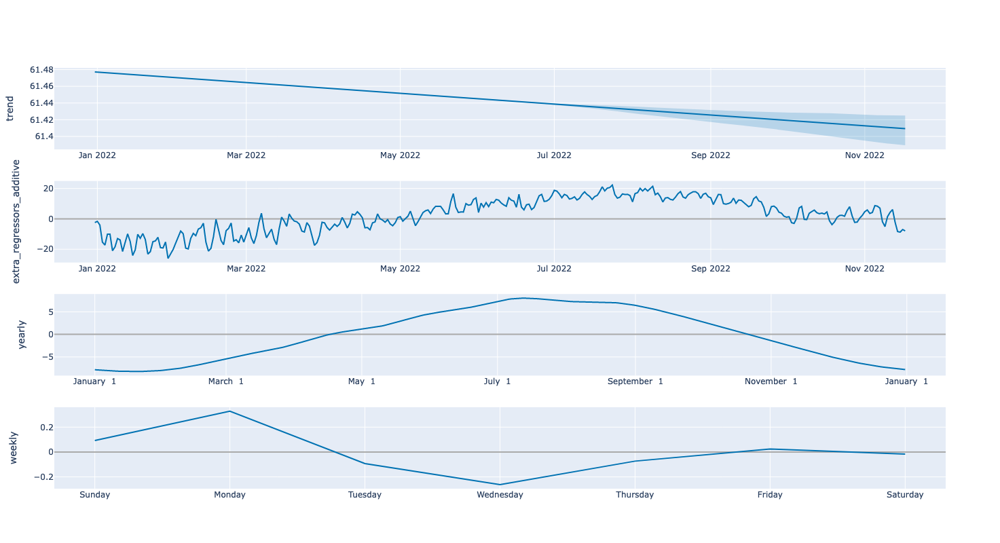

In [18]:
from prophet.plot import plot_plotly, plot_components_plotly, plot_cross_validation_metric

plot_components_plotly(m, predictions)

In [19]:
from prophet.utilities import regressor_coefficients

regressor_coefficients(m)

,regressor,regressor_mode,center,coef_lower,coef,coef_upper
0,prcp_x,additive,0.118130,-0.196301,-0.196301,-0.196301
1,snow_x,additive,0.064540,-0.011489,-0.011489,-0.011489
2,snwd_x,additive,0.209635,0.065631,0.065631,0.065631
3,tmax_x,additive,61.758648,0.013376,0.013376,0.013376
4,tmin_x,additive,47.494024,-0.082561,-0.082561,-0.082561
5,prcp_y,additive,0.123378,-0.322943,-0.322943,-0.322943
6,snow_y,additive,0.071347,-0.491580,-0.491580,-0.491580
7,snwd_y,additive,0.217759,-0.203044,-0.203044,-0.203044
8,tmax_y,additive,62.609277,0.280567,0.280567,0.280567
9,tmin_y,additive,48.923130,0.426044,0.426044,0.426044


In [20]:
predictions.index = test.index
predictions["actual"] = test["y"]

In [21]:
def mse(predictions, actual_label="actual", pred_label="yhat"):
    se = ((predictions[actual_label] - predictions[pred_label]) ** 2)
    print(se.mean())
    
mse(predictions)

40.488169352747704


In [22]:
# Cross validate across data set
from prophet.diagnostics import cross_validation, performance_metrics


m = fit_prophet(weather)
cv = cross_validation(m, initial=f'{365 * 5} days', period='180 days', horizon = '180 days', parallel="processes")

09:41:04 - cmdstanpy - INFO - Chain [1] start processing
09:41:06 - cmdstanpy - INFO - Chain [1] done processing
09:41:11 - cmdstanpy - INFO - Chain [1] start processing
09:41:12 - cmdstanpy - INFO - Chain [1] start processing
09:41:12 - cmdstanpy - INFO - Chain [1] done processing
09:41:12 - cmdstanpy - INFO - Chain [1] start processing
09:41:12 - cmdstanpy - INFO - Chain [1] start processing
09:41:12 - cmdstanpy - INFO - Chain [1] start processing
09:41:12 - cmdstanpy - INFO - Chain [1] start processing
09:41:12 - cmdstanpy - INFO - Chain [1] done processing
09:41:12 - cmdstanpy - INFO - Chain [1] done processing
09:41:12 - cmdstanpy - INFO - Chain [1] start processing
09:41:12 - cmdstanpy - INFO - Chain [1] start processing
09:41:12 - cmdstanpy - INFO - Chain [1] start processing
09:41:12 - cmdstanpy - INFO - Chain [1] start processing
09:41:12 - cmdstanpy - INFO - Chain [1] done processing
09:41:12 - cmdstanpy - INFO - Chain [1] done processing
09:41:12 - cmdstanpy - INFO - Chain [

In [23]:
mse(cv, actual_label="y")

36.18005283052067


<AxesSubplot:>

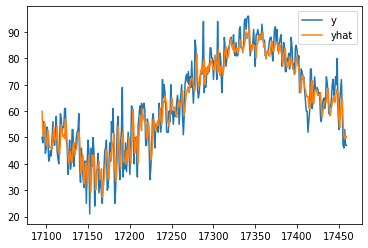

In [24]:
cv[["y", "yhat"]][-365:].plot()

In [25]:
# Predict one day ahead with high accuracy
m = fit_prophet(weather)
m.predict(weather.iloc[-1:])

09:42:16 - cmdstanpy - INFO - Chain [1] start processing
09:42:19 - cmdstanpy - INFO - Chain [1] done processing


,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,extra_regressors_additive,...,weekly,weekly_lower,weekly_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
0,2022-11-17,61.685471,41.950222,57.487635,61.685471,61.685471,-11.530654,-11.530654,-11.530654,-7.906123,...,-0.065163,-0.065163,-0.065163,-3.559368,-3.559368,-3.559368,0.0,0.0,0.0,50.154817


In [26]:
# Predict multiple days ahead with lower accuracy
m = Prophet()
m.fit(weather)
future = m.make_future_dataframe(periods=365)
forecast = m.predict(future)

09:42:20 - cmdstanpy - INFO - Chain [1] start processing
09:42:21 - cmdstanpy - INFO - Chain [1] done processing


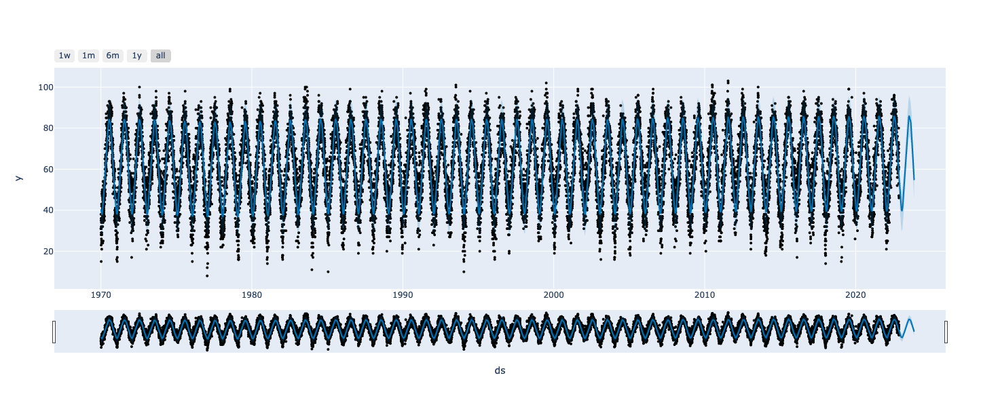

In [27]:
from prophet.plot import plot_plotly

plot_plotly(m, forecast)